# Import library

In [1]:
# Basic Library
import numpy as np
import pandas as pd
import pickle

# Data Visualization
import matplotlib.pyplot as plt
from matplotlib import pyplot
import seaborn as sns
from ydata_profiling import ProfileReport
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
%matplotlib inline

# TRaiun Test Split
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder

# Algorithim
from sklearn.svm import SVC
from sklearn import tree
from xgboost import XGBClassifier

# Metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,accuracy_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# warnings
import warnings
warnings.filterwarnings('ignore')

Imported v0.1.808. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


# Load Dataset

In [2]:
Career = pd.read_csv('./sample_data.csv')

# Data Pre- processing

In [3]:
Career.head()

,sslc,hsc,cgpa,school_type,no_of_miniprojects,no_of_projects,coresub_skill,aptitude_skill,problemsolving_skill,programming_skill,abstractthink_skill,design_skill,first_computer,first_program,lab_programs,ds_coding,technology_used,sympos_attend,sympos_won,extracurricular,learning_style,college_bench,clg_teachers_know,college_performence,college_skills,ROLE
0,2,3,2,3,1,1,1,1,2,4,2,2,2,3,4,1,1,3,1,2,2,4,3,4,5,Technical Support
1,3,1,2,2,2,1,1,3,2,4,3,3,1,3,4,2,2,3,2,3,2,5,3,3,4,Software Developer
2,3,4,2,2,1,1,1,2,3,3,2,3,2,2,2,1,1,4,3,1,4,3,3,3,4,UI/UX Designer
3,3,4,2,1,1,1,1,1,3,2,2,2,2,3,4,2,1,3,2,1,2,1,4,4,3,Technical Support
4,2,3,2,4,1,1,1,4,3,3,2,3,2,4,4,2,1,2,1,3,1,5,4,3,1,Data Analyst


In [4]:
Career.tail()

,sslc,hsc,cgpa,school_type,no_of_miniprojects,no_of_projects,coresub_skill,aptitude_skill,problemsolving_skill,programming_skill,abstractthink_skill,design_skill,first_computer,first_program,lab_programs,ds_coding,technology_used,sympos_attend,sympos_won,extracurricular,learning_style,college_bench,clg_teachers_know,college_performence,college_skills,ROLE
7520,3,2,1,2,1,1,2,2,3,3,3,4,2,4,4,4,1,4,2,2,1,4,4,3,3,NaN
7521,2,3,3,3,4,3,2,1,3,3,3,3,2,4,4,3,4,2,3,2,4,1,3,3,2,NaN
7522,3,2,1,2,1,1,1,2,2,3,1,2,1,3,3,2,1,3,1,1,3,5,3,3,4,NaN
7523,2,1,1,1,2,1,1,2,2,2,2,3,1,3,4,2,1,3,2,1,2,4,4,3,4,NaN
7524,2,2,2,3,2,1,1,1,2,3,2,3,2,2,4,1,1,4,1,1,3,5,3,3,5,NaN


In [5]:
Career.shape

(7525, 26)

In [6]:
Career.columns

Index(['sslc', 'hsc', 'cgpa', 'school_type', 'no_of_miniprojects',
       'no_of_projects', 'coresub_skill', 'aptitude_skill',
       'problemsolving_skill', 'programming_skill', 'abstractthink_skill',
       'design_skill', 'first_computer', 'first_program', 'lab_programs',
       'ds_coding', 'technology_used', 'sympos_attend', 'sympos_won',
       'extracurricular', 'learning_style', 'college_bench',
       'clg_teachers_know', 'college_performence ', 'college_skills', 'ROLE'],
      dtype='object')

In [7]:
Career.dtypes

sslc                     int64
hsc                      int64
cgpa                     int64
school_type              int64
no_of_miniprojects       int64
no_of_projects           int64
coresub_skill            int64
aptitude_skill           int64
problemsolving_skill     int64
programming_skill        int64
abstractthink_skill      int64
design_skill             int64
first_computer           int64
first_program            int64
lab_programs             int64
ds_coding                int64
technology_used          int64
sympos_attend            int64
sympos_won               int64
extracurricular          int64
learning_style          object
college_bench            int64
clg_teachers_know        int64
college_performence      int64
college_skills           int64
ROLE                    object
dtype: object

In [8]:
Career.nunique()

sslc                    4
hsc                     4
cgpa                    4
school_type             4
no_of_miniprojects      4
no_of_projects          4
coresub_skill           2
aptitude_skill          4
problemsolving_skill    4
programming_skill       5
abstractthink_skill     4
design_skill            4
first_computer          2
first_program           4
lab_programs            4
ds_coding               4
technology_used         4
sympos_attend           4
sympos_won              5
extracurricular         4
learning_style          5
college_bench           5
clg_teachers_know       4
college_performence     4
college_skills          5
ROLE                    8
dtype: int64

In [9]:
Career.sample(10)

,sslc,hsc,cgpa,school_type,no_of_miniprojects,no_of_projects,coresub_skill,aptitude_skill,problemsolving_skill,programming_skill,abstractthink_skill,design_skill,first_computer,first_program,lab_programs,ds_coding,technology_used,sympos_attend,sympos_won,extracurricular,learning_style,college_bench,clg_teachers_know,college_performence,college_skills,ROLE
4902,2,3,1,4,1,1,2,1,3,3,1,1,1,1,4,1,1,1,2,1,4,4,3,1,1,NaN
3473,4,4,3,1,1,1,2,2,3,3,2,2,1,1,2,1,1,3,2,2,2,5,4,3,3,NaN
5105,3,3,2,2,2,1,1,1,2,3,4,3,2,3,4,2,1,4,3,3,4,3,4,4,1,NaN
5547,4,4,4,1,1,1,2,1,4,1,1,1,2,4,4,1,1,4,1,4,2,5,4,4,1,NaN
184,3,4,2,1,1,1,1,3,3,3,3,2,2,4,4,3,1,3,3,2,2,2,3,3,5,NaN
6018,2,4,2,1,1,1,1,1,1,1,1,1,2,3,1,2,1,3,3,3,2,4,4,3,4,NaN
4053,2,3,2,2,2,2,2,2,3,3,3,3,2,4,4,2,1,3,2,3,3,3,4,4,2,NaN
2492,3,2,2,2,2,1,1,1,3,3,2,4,2,4,4,1,1,3,3,4,2,5,4,3,4,NaN
328,3,3,3,1,2,2,2,2,3,3,3,3,2,3,4,2,1,1,1,3,1,3,3,3,2,NaN
141,3,3,2,1,1,1,2,1,4,1,4,3,2,3,4,1,1,3,1,2,2,3,3,3,2,NaN


In [10]:
Career['ROLE'].unique()

array(['Technical Support', 'Software Developer', 'UI/UX Designer',
       'Data Analyst', 'Technical Writer', 'Web Developer',
       'Software Tester', 'Business Analyst', nan], dtype=object)

In [11]:
Career.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7525 entries, 0 to 7524
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   sslc                  7525 non-null   int64 
 1   hsc                   7525 non-null   int64 
 2   cgpa                  7525 non-null   int64 
 3   school_type           7525 non-null   int64 
 4   no_of_miniprojects    7525 non-null   int64 
 5   no_of_projects        7525 non-null   int64 
 6   coresub_skill         7525 non-null   int64 
 7   aptitude_skill        7525 non-null   int64 
 8   problemsolving_skill  7525 non-null   int64 
 9   programming_skill     7525 non-null   int64 
 10  abstractthink_skill   7525 non-null   int64 
 11  design_skill          7525 non-null   int64 
 12  first_computer        7525 non-null   int64 
 13  first_program         7525 non-null   int64 
 14  lab_programs          7525 non-null   int64 
 15  ds_coding             7525 non-null   

In [12]:
Career.describe()

,sslc,hsc,cgpa,school_type,no_of_miniprojects,no_of_projects,coresub_skill,aptitude_skill,problemsolving_skill,programming_skill,abstractthink_skill,design_skill,first_computer,first_program,lab_programs,ds_coding,technology_used,sympos_attend,sympos_won,extracurricular,college_bench,clg_teachers_know,college_performence,college_skills
count,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000,7525.000000
mean,2.907243,3.043056,2.138738,1.799070,1.537276,1.188439,1.513223,2.041196,2.863256,2.887442,2.447575,2.498073,1.680930,3.257940,3.584585,2.050498,1.204917,2.856877,1.972359,2.182990,3.988040,3.597874,3.350299,2.995748
std,0.939084,0.900414,0.803465,0.711248,0.735916,0.545728,0.499858,1.085477,0.728428,0.754894,0.866759,0.846642,0.466147,0.757589,0.790142,0.748276,0.574120,1.027328,1.002539,1.094488,0.778578,0.565860,0.522819,1.409500
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.000000,3.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,2.000000,2.000000,1.000000,3.000000,4.000000,2.000000,1.000000,2.000000,1.000000,1.000000,4.000000,3.000000,3.000000,2.000000
50%,3.000000,3.000000,2.000000,2.000000,1.000000,1.000000,2.000000,2.000000,3.000000,3.000000,2.000000,2.000000,2.000000,3.000000,4.000000,2.000000,1.000000,3.000000,2.000000,2.000000,4.000000,4.000000,3.000000,3.000000
75%,4.000000,4.000000,3.000000,2.000000,2.000000,1.000000,2.000000,3.000000,3.000000,3.000000,3.000000,3.000000,2.000000,4.000000,4.000000,2.000000,1.000000,4.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000
max,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,2.000000,4.000000,4.000000,5.000000,4.000000,4.000000,2.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,4.000000,5.000000


In [13]:
Career.isnull().any()

sslc                    False
hsc                     False
cgpa                    False
school_type             False
no_of_miniprojects      False
no_of_projects          False
coresub_skill           False
aptitude_skill          False
problemsolving_skill    False
programming_skill       False
abstractthink_skill     False
design_skill            False
first_computer          False
first_program           False
lab_programs            False
ds_coding               False
technology_used         False
sympos_attend           False
sympos_won              False
extracurricular         False
learning_style          False
college_bench           False
clg_teachers_know       False
college_performence     False
college_skills          False
ROLE                     True
dtype: bool

In [14]:
Career.isnull().sum()

sslc                       0
hsc                        0
cgpa                       0
school_type                0
no_of_miniprojects         0
no_of_projects             0
coresub_skill              0
aptitude_skill             0
problemsolving_skill       0
programming_skill          0
abstractthink_skill        0
design_skill               0
first_computer             0
first_program              0
lab_programs               0
ds_coding                  0
technology_used            0
sympos_attend              0
sympos_won                 0
extracurricular            0
learning_style             0
college_bench              0
clg_teachers_know          0
college_performence        0
college_skills             0
ROLE                    7476
dtype: int64

# Data Visualization

In [15]:
profile = ProfileReport(Career, title="Career prediction")
profile.to_notebook_iframe()
profile.to_file("Recommendation.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Shape of your Data Set loaded: (7525, 26)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  22
    Number of String-Categorical Columns =  1
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  2
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    25 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Multi_Classification problem #####################
To fix these data quali

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
sslc,int64,0.000000,0,1.000000,4.000000,No issue
hsc,int64,0.000000,0,1.000000,4.000000,Column has 509 outliers greater than upper bound (5.50) or lower than lower bound(1.50). Cap them or remove them.
cgpa,int64,0.000000,0,1.000000,4.000000,No issue
school_type,int64,0.000000,0,1.000000,4.000000,Column has 144 outliers greater than upper bound (3.50) or lower than lower bound(-0.50). Cap them or remove them.
no_of_miniprojects,int64,0.000000,0,1.000000,4.000000,Column has 242 outliers greater than upper bound (3.50) or lower than lower bound(-0.50). Cap them or remove them.
no_of_projects,int64,0.000000,0,1.000000,4.000000,Column has 1002 outliers greater than upper bound (1.00) or lower than lower bound(1.00). Cap them or remove them.
coresub_skill,int64,0.000000,0,1.000000,2.000000,No issue
aptitude_skill,int64,0.000000,0,1.000000,4.000000,No issue
problemsolving_skill,int64,0.000000,0,1.000000,4.000000,No issue
programming_skill,int64,0.000000,0,1.000000,5.000000,Column has 326 outliers greater than upper bound (4.50) or lower than lower bound(0.50). Cap them or remove them.


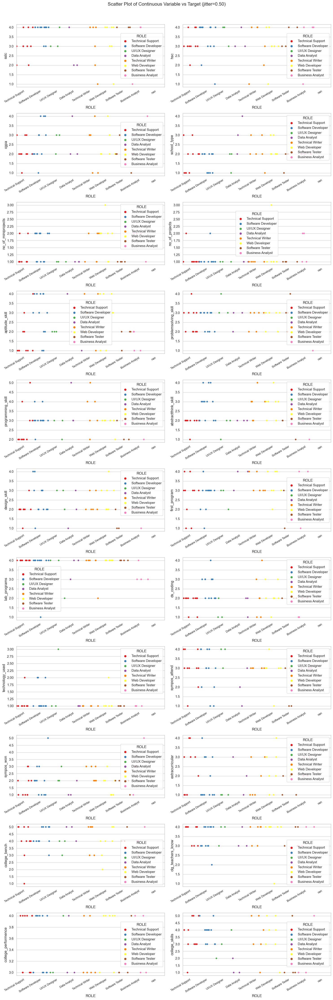

Total Number of Scatter Plots = 253


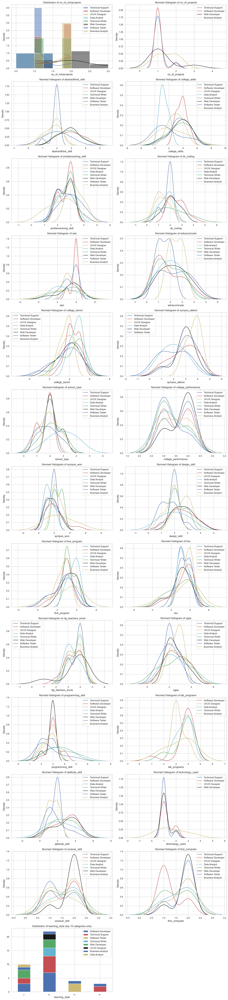

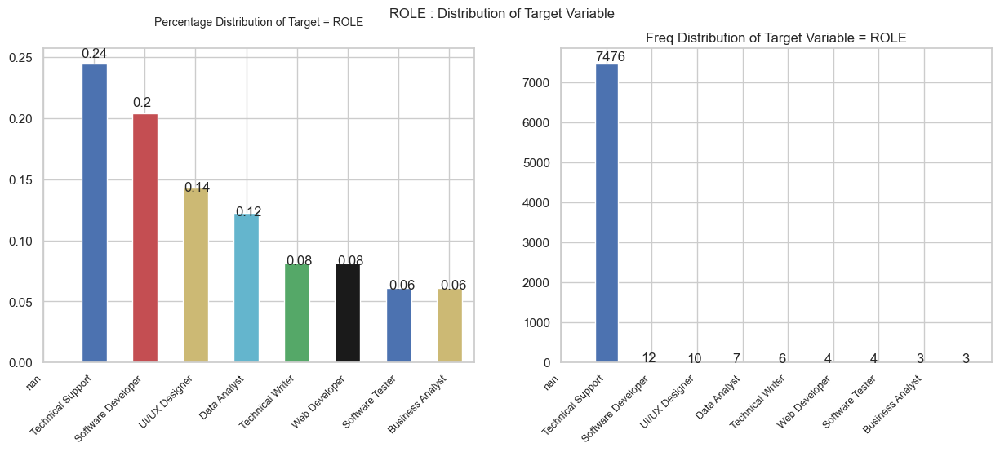

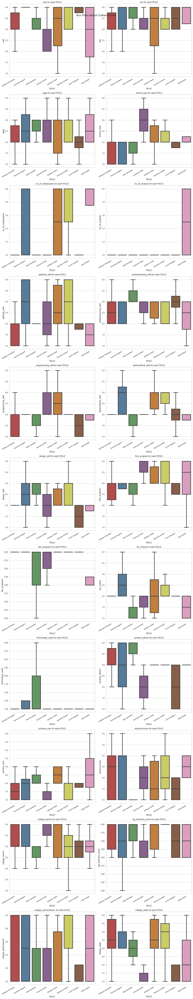

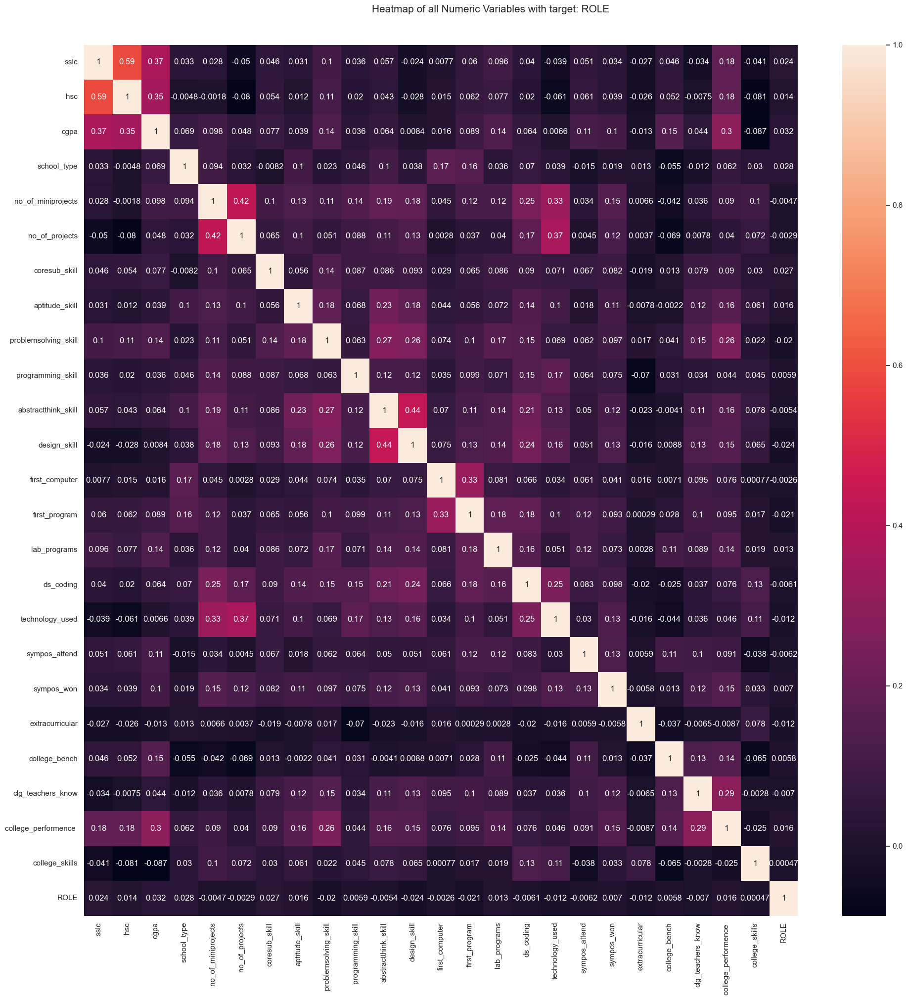

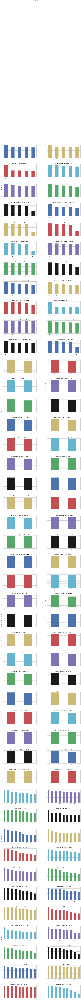

All Plots done
Time to run AutoViz = 116 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [16]:
filename = "sample_data.csv"
target_variable = "ROLE"

dft = AV.AutoViz(
    filename,
    sep=",",
    depVar=target_variable,
    dfte=None,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None
)

# Label Encoding

In [17]:
data = Career.iloc[:49,:-1].values
label = Career.iloc[:49,-1]

In [18]:
labelencoder = LabelEncoder()
df = Career
label = df.iloc[:49,-1]
original=label.unique() 
label=label.values
label2 = labelencoder.fit_transform(label)
y=pd.DataFrame(label2,columns=["ROLE"])
numeric=y["ROLE"].unique() 
y1 = pd.DataFrame({'ROLE':original, 'Associated Number':numeric})
print(y1)

          ROLE         Associated Number
0   Technical Support          4        
1  Software Developer          2        
2      UI/UX Designer          6        
3        Data Analyst          1        
4    Technical Writer          5        
5       Web Developer          7        
6     Software Tester          3        
7    Business Analyst          0        


In [19]:
labelencoder = LabelEncoder()
label = labelencoder.fit_transform(label)
y=pd.DataFrame(label,columns=["role"])
X = pd.DataFrame(data,columns=['sslc','hsc','cgpa','school_type','no_of_miniprojects','no_of_projects',
                                'coresub_skill','aptitude_skill','problemsolving_skill','programming_skill','abstractthink_skill',
                                'design_skill','first_computer','first_program','lab_programs','ds_coding','technology_used',
                                'sympos_attend','sympos_won','extracurricular','learning_style','college_bench','clg_teachers_know','college_performence','college_skills'])
     

# Feature selection

### Chi squared

Feature 0: 2.101772
Feature 1: 0.955491
Feature 2: 1.599306
Feature 3: 1.769333
Feature 4: 3.316358
Feature 5: 1.125758
Feature 6: 1.299609
Feature 7: 6.225678
Feature 8: 1.013542
Feature 9: 1.529464
Feature 10: 6.433067
Feature 11: 3.607745
Feature 12: 0.611667
Feature 13: 1.566959
Feature 14: 0.907095
Feature 15: 4.838542
Feature 16: 1.000189
Feature 17: 2.309167
Feature 18: 2.526337
Feature 19: 3.994762
Feature 20: 3.109337
Feature 21: 0.519778
Feature 22: 0.356387
Feature 23: 0.116054
Feature 24: 5.677100


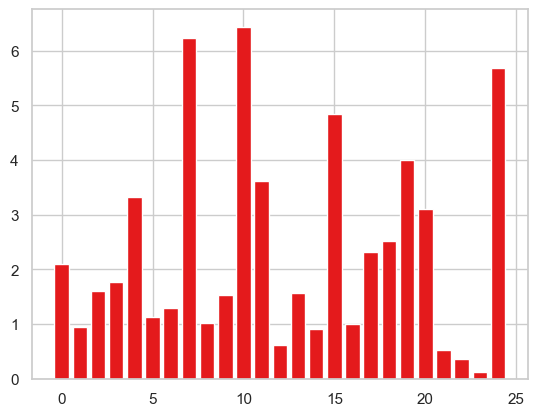

 The number of important features with threshold as 1 :19 
Feature 0: 2.647197
Feature 1: 0.606646
Feature 2: 0.987726
Feature 3: 3.816667
Feature 4: 2.366213
Feature 5: 1.146154
Feature 6: 1.424897
Feature 7: 4.506504
Feature 8: 1.653086
Feature 9: 1.386111
Feature 10: 3.688753
Feature 11: 2.377637
Feature 12: 1.653040
Feature 13: 1.869637
Feature 14: 0.573077
Feature 15: 2.759781
Feature 16: 1.664387
Feature 17: 2.188087
Feature 18: 3.249751
Feature 19: 4.095988
Feature 20: 1.730137
Feature 21: 0.844985
Feature 22: 0.326944
Feature 23: 0.498964
Feature 24: 7.232533


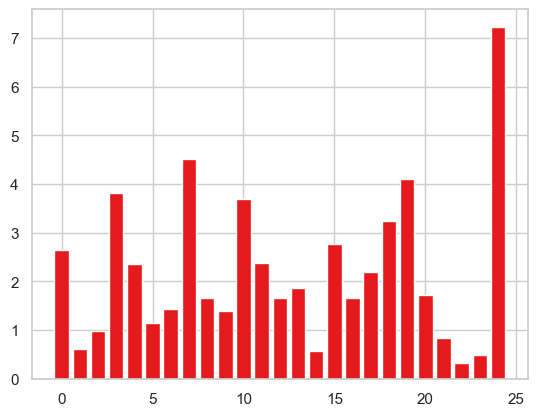

 The number of important features with threshold as 1 :19 


In [20]:
def select_features(X_train, y_train, X_test):
	fs = SelectKBest(score_func=chi2, k='all')
	fs.fit(X_train, y_train)
	X_train_fs = fs.transform(X_train)
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs

# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=20)#Decision tree
X_train2,X_test2,y_train2,y_test2=train_test_split(X,y,test_size=0.3,random_state=10)#XGBoost
X_train6,X_test6,y_train6,y_test6=train_test_split(X,y,test_size=0.2,random_state=15)#SVM

X_train1, X_test1, fs1 = select_features(X_train, y_train, X_test)
X_train3, X_test3, fs3 = select_features(X_train2, y_train2, X_test2)
X_train5, X_test5, fs5 = select_features(X_train2, y_train2, X_test2)

# what are scores for the features
for i in range(len(fs1.scores_)):
	print('Feature %d: %f' % (i, fs1.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs1.scores_))], fs1.scores_)
pyplot.show()

count = 0
for i in fs1.scores_ : 
    if i > 1 : 
        count = count + 1
k1=count
print(" The number of important features with threshold as 1 :{} ".format(k1))


for i in range(len(fs3.scores_)):
	print('Feature %d: %f' % (i, fs3.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs3.scores_))], fs3.scores_)
pyplot.show()

count = 0
for i in fs3.scores_ : 
    if i > 1 : 
        count = count + 1
k3=count

print(" The number of important features with threshold as 1 :{} ".format(k3))

Feature 0: 2.647197
Feature 1: 0.606646
Feature 2: 0.987726
Feature 3: 3.816667
Feature 4: 2.366213
Feature 5: 1.146154
Feature 6: 1.424897
Feature 7: 4.506504
Feature 8: 1.653086
Feature 9: 1.386111
Feature 10: 3.688753
Feature 11: 2.377637
Feature 12: 1.653040
Feature 13: 1.869637
Feature 14: 0.573077
Feature 15: 2.759781
Feature 16: 1.664387
Feature 17: 2.188087
Feature 18: 3.249751
Feature 19: 4.095988
Feature 20: 1.730137
Feature 21: 0.844985
Feature 22: 0.326944
Feature 23: 0.498964
Feature 24: 7.232533


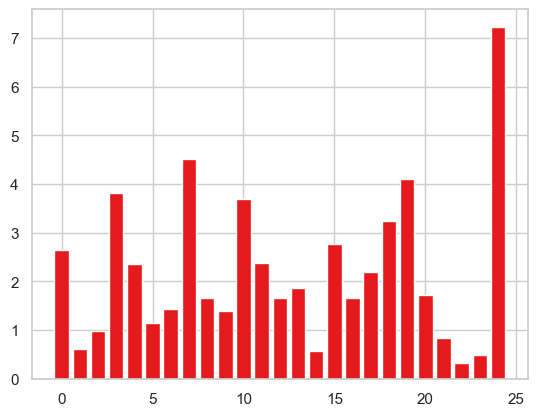

 The number of important features with threshold as 1 : 19


In [21]:
for i in range(len(fs5.scores_)):
	print('Feature %d: %f' % (i, fs5.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs5.scores_))], fs5.scores_)
pyplot.show()

count = 0
for i in fs5.scores_ : 
    if i > 1 : 
        count = count + 1
k5=count

print(" The number of important features with threshold as 1 : {}" .format(k5))

In [22]:
def select_features(X_train, y_train, X_test):
	fs = SelectKBest(score_func=chi2,k=k1)
	fs.fit(X_train, y_train)
	X_train_fs = fs.transform(X_train)
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs

def select_features2(X_train, y_train, X_test):
	fs = SelectKBest(score_func=chi2,k=k3)
	fs.fit(X_train, y_train)
	X_train_fs = fs.transform(X_train)
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs

def select_features3(X_train, y_train, X_test):
	fs = SelectKBest(score_func=chi2,k=k5)
	fs.fit(X_train, y_train)
	X_train_fs = fs.transform(X_train)
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs


X_train1, X_test1, fs = select_features(X_train, y_train, X_test)
X_train3, X_test3, fs = select_features2(X_train2, y_train2, X_test2)
X_train5, X_test5, fs = select_features3(X_train6, y_train6, X_test6)

# Model Implementation

### Support Vector machine

In [23]:
X_train

,sslc,hsc,cgpa,school_type,no_of_miniprojects,no_of_projects,coresub_skill,aptitude_skill,problemsolving_skill,programming_skill,abstractthink_skill,design_skill,first_computer,first_program,lab_programs,ds_coding,technology_used,sympos_attend,sympos_won,extracurricular,learning_style,college_bench,clg_teachers_know,college_performence,college_skills
17,4,4,4,2,2,1,1,4,2,3,2,3,1,2,4,3,1,4,5,1,1,5,4,4,4
0,2,3,2,3,1,1,1,1,2,4,2,2,2,3,4,1,1,3,1,2,2,4,3,4,5
33,4,4,4,2,2,1,1,2,3,3,2,2,2,4,3,2,1,3,5,3,2,4,3,4,1
18,3,3,2,1,1,1,1,1,2,2,2,2,1,3,4,2,1,3,1,4,2,5,4,3,5
46,4,3,2,1,2,1,1,1,3,3,2,2,2,1,4,2,1,1,1,1,2,5,4,3,3
41,4,3,2,2,1,1,2,2,2,2,2,1,1,3,4,2,1,1,2,2,2,2,3,3,1
36,4,4,3,2,1,1,2,2,3,3,2,2,2,3,4,2,1,3,1,1,3,4,3,3,1
10,4,4,2,2,1,1,1,3,3,2,3,2,1,3,4,3,1,3,3,3,2,5,4,4,3
3,3,4,2,1,1,1,1,1,3,2,2,2,2,3,4,2,1,3,2,1,2,1,4,4,3
40,4,4,4,2,2,1,2,4,2,3,4,2,2,3,4,4,1,4,1,1,4,4,4,4,3


Model accuracy score with default hyperparameters: 40.0000


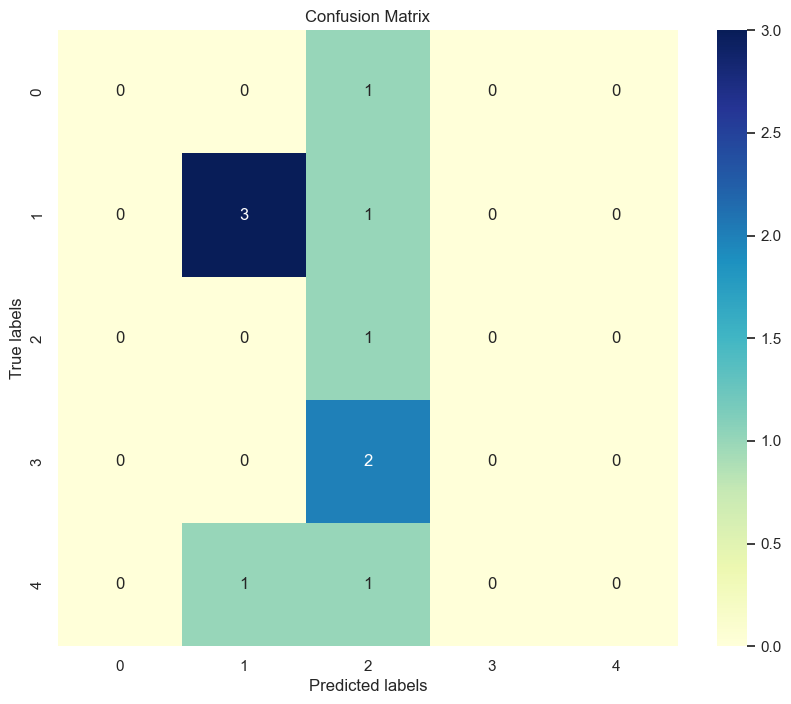


Classification Report:
               precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.75      0.75      0.75         4
           4       0.17      1.00      0.29         1
           5       0.00      0.00      0.00         2
           7       0.00      0.00      0.00         2

    accuracy                           0.40        10
   macro avg       0.18      0.35      0.21        10
weighted avg       0.32      0.40      0.33        10



In [24]:
def svm(X_train, y_train, X_test, y_test):
    
    # Initialize the SVM classifier
    svc = SVC()

    # Fit classifier to the training set
    svc.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred = svc.predict(X_test)

    # Compute and print accuracy score
    accuracy = accuracy_score(y_test, y_pred)
    print('Model accuracy score with default hyperparameters: {0:0.4f}'.format(accuracy * 100))

    # Compute confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Generate classification report
    report = classification_report(y_test, y_pred)

    # Plot heatmap for confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", xticklabels=range(5), yticklabels=range(5))
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title('Confusion Matrix')
    plt.show()

    # Print classification report
    print("\nClassification Report:\n", report)
    with open('svc.pkl', 'wb') as file:
        pickle.dump(svc, file)


    return accuracy * 100

# # Call the function with and without feature selection
# print("Without feature Selection : ")
# acc = svm(X_train6, y_train6, X_test6, y_test6)

# print("With feature Selection : ")
# acc1 = svm(X_train5, y_train6, X_test5, y_test6)
acc1 = svm(X_train, y_train, X_test, y_test)


### Decision tree

Without feature Selection : 
Model accuracy score with Decision Tree: 30.0


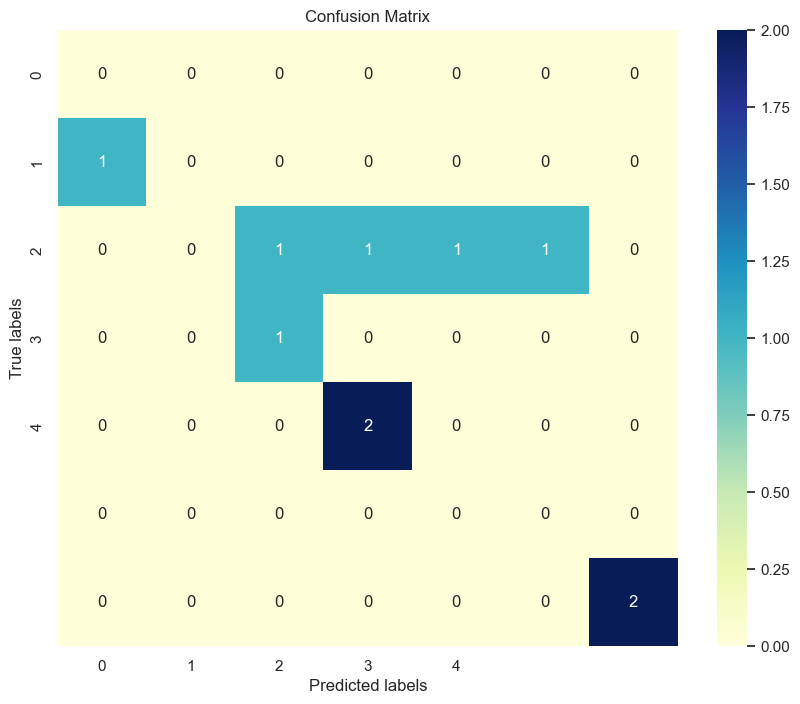


Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.00      0.00      0.00         1
           2       0.50      0.25      0.33         4
           4       0.00      0.00      0.00         1
           5       0.00      0.00      0.00         2
           6       0.00      0.00      0.00         0
           7       1.00      1.00      1.00         2

    accuracy                           0.30        10
   macro avg       0.21      0.18      0.19        10
weighted avg       0.40      0.30      0.33        10

With feature Selection : 
Model accuracy score with Decision Tree: 40.0


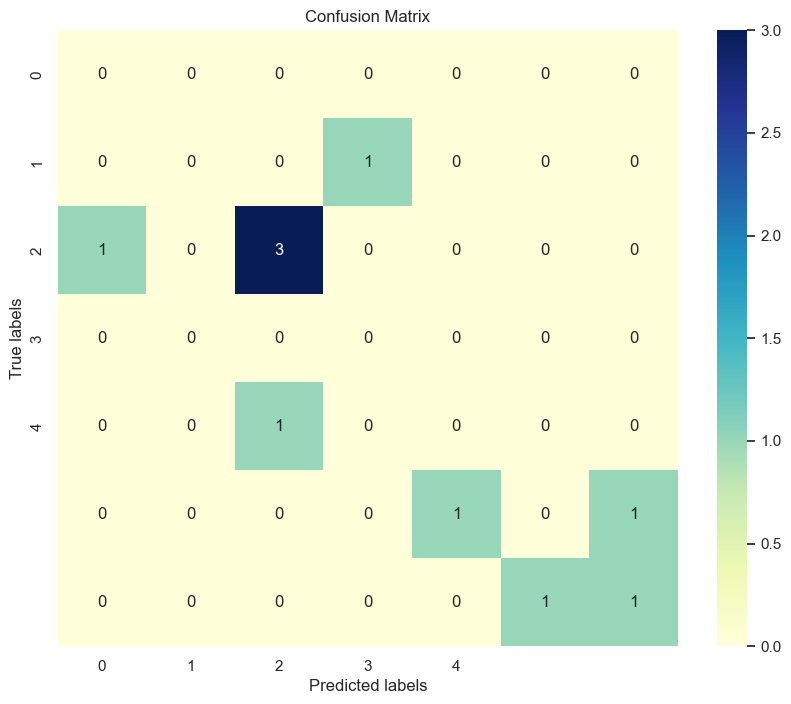


Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.00      0.00      0.00         1
           2       0.75      0.75      0.75         4
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         1
           5       0.00      0.00      0.00         2
           7       0.50      0.50      0.50         2

    accuracy                           0.40        10
   macro avg       0.18      0.18      0.18        10
weighted avg       0.40      0.40      0.40        10



In [25]:
def Dec_tree(X_train, y_train, X_test, y_test):
   
    # Initialize the Decision Tree classifier
    clf = tree.DecisionTreeClassifier()

    # Fit classifier to the training set
    clf = clf.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred = clf.predict(X_test)

    # Compute accuracy score
    accuracy = accuracy_score(y_test, y_pred)
    print('Model accuracy score with Decision Tree:', accuracy * 100)

    # Compute confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Generate classification report
    report = classification_report(y_test, y_pred)

    # Plot heatmap for confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", xticklabels=range(5), yticklabels=range(5))
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title('Confusion Matrix')
    plt.show()

    # Print classification report
    print("\nClassification Report:\n", report)
    with open('clf.pkl', 'wb') as file:
        pickle.dump(clf, file)


    return accuracy * 100, clf

# Call the function with and without feature selection
print("Without feature Selection : ")
acc1, clf1 = Dec_tree(X_train1, y_train, X_test1, y_test)

print("With feature Selection : ")
acc, clf = Dec_tree(X_train, y_train, X_test, y_test)


Boosting the Decision Tree
Accuracy:  93.33333333333333


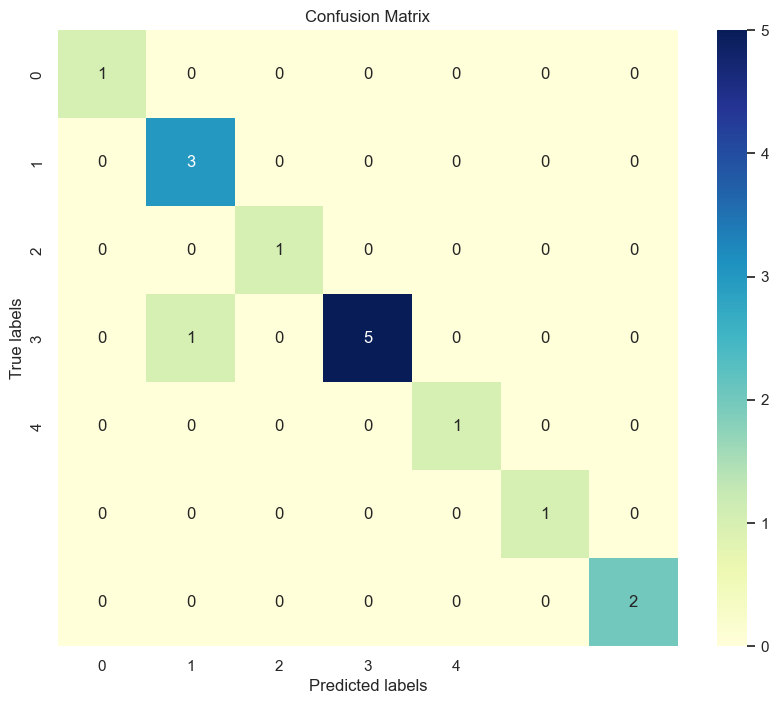


Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00         1
           2       0.75      1.00      0.86         3
           3       1.00      1.00      1.00         1
           4       1.00      0.83      0.91         6
           5       1.00      1.00      1.00         1
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         2

    accuracy                           0.93        15
   macro avg       0.96      0.98      0.97        15
weighted avg       0.95      0.93      0.94        15



In [26]:
def xgboost(X_train, y_train, X_test, y_test, clf):
    
    # Reshape X_train if needed
    shape = X_train.shape
    X_train = pd.to_numeric(X_train.values.flatten())
    X_train = X_train.reshape(shape)

    # Initialize XGBClassifier
    model = XGBClassifier()

    # Fit the model to the training data
    model.fit(X_train, y_train)

    # Make predictions on the test set
    xgb_y_pred = clf.predict(X_test)

    # Compute accuracy
    xgb_accuracy = accuracy_score(y_test, xgb_y_pred)
    print("Accuracy: ", xgb_accuracy * 100)

    # Compute confusion matrix
    cm = confusion_matrix(y_test, xgb_y_pred)

    # Generate classification report
    report = classification_report(y_test, xgb_y_pred)

    # Plot heatmap for confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", xticklabels=range(5), yticklabels=range(5))
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title('Confusion Matrix')
    plt.show()

    # Print classification report
    print("\nClassification Report:\n", report)
    with open('xgb.pkl', 'wb') as file:
        pickle.dump(model, file)


    return xgb_accuracy * 100

# Call the function
print("Boosting the Decision Tree")
acc = xgboost(X_train2, y_train2, X_test2, y_test2, clf)


# Blockcain and Prediction

In [27]:
import os.path
import hashlib
import json
import time
import pandas as pd
from datetime import datetime

class Block:
    def __init__(self, index, timestamp, data, previous_hash):
        self.index = index
        self.timestamp = timestamp
        self.data = data
        self.previous_hash = previous_hash
        self.nonce = 0
        self.hash = self.compute_hash()

    def compute_hash(self):
        block_string = json.dumps({"index": self.index, "timestamp": self.timestamp, "data": self.data, "previous_hash": self.previous_hash}, sort_keys=True)
        return hashlib.sha256(block_string.encode()).hexdigest()

class Blockchain:
    def __init__(self):
        self.chain = []
        self.create_genesis_block()

    def create_genesis_block(self):
        genesis_block = Block(0, time.time(), "Genesis Block", "0")
        self.chain.append(genesis_block)

    def add_block(self, block):
        block.previous_hash = self.chain[-1].hash
        block.hash = block.compute_hash()
        self.chain.append(block)

    def is_chain_valid(self):
        for i in range(1, len(self.chain)):
            current_block = self.chain[i]
            previous_block = self.chain[i - 1]

            if current_block.hash != current_block.compute_hash():
                return False
            
            if current_block.previous_hash != previous_block.hash:
                return False

        return True

# Define columns for the new dataset
columns = ['Student_ID', 'Index', 'Timestamp', 'SSLC', 'HSC', 'CGPA', 'School_Type', 'No_of_Miniprojects', 'No_of_Projects', 'Coresub_Skill', 'Aptitude_Skill', 'Problemsolving_Skill', 'Programming_Skill', 'Abstractthink_Skill', 'Design_Skill', 'First_Computer', 'First_Program', 'Lab_Programs', 'DS_Coding', 'Technology_Used', 'Sympos_Attend', 'Sympos_Won', 'Extracurricular', 'Learning_Style', 'College_Bench', 'Clg_Teachers_Know', 'College_Performence', 'College_Skills', 'Role', 'Prediction']

# Check if the CSV file exists
csv_file = "updated.csv"
if os.path.exists(csv_file):
    # Load existing data from CSV file
    existing_data = pd.read_csv(csv_file)
    block_data_list = existing_data.to_dict('records')
else:
    block_data_list = []

# Create a blockchain instance
blockchain = Blockchain()

while True:
    # Get student ID from user input
    student_id = input("Enter student ID: ")

    # Get student data from user input
    student_data = {}
    for attribute in ['SSLC', 'HSC', 'CGPA', 'School_Type', 'No_of_Miniprojects', 'No_of_Projects', 'Coresub_Skill', 'Aptitude_Skill', 'Problemsolving_Skill', 'Programming_Skill', 'Abstractthink_Skill', 'Design_Skill', 'First_Computer', 'First_Program', 'Lab_Programs', 'DS_Coding', 'Technology_Used', 'Sympos_Attend', 'Sympos_Won', 'Extracurricular', 'Learning_Style', 'College_Bench', 'Clg_Teachers_Know', 'College_Performence', 'College_Skills']:
        student_data[attribute] = input(f"Enter student's {attribute}: ")

    # Make a prediction using the machine learning model
    new_pred = clf.predict([list(map(float, student_data.values()))])

    # Store the prediction in the student data
    student_data['Prediction'] = y1[y1['Associated Number'] == new_pred[0]]['ROLE'].values[0]

    # Append the student ID and data to block_data_list
    block_data_list.append({'Student_ID': student_id, 'Index': len(block_data_list), 'Timestamp': time.time(), **student_data, 'Prediction': student_data['Prediction']})

    # Create a new block and add it to the blockchain
    new_block = Block(len(blockchain.chain), time.time(), student_data, blockchain.chain[-1].hash)
    blockchain.add_block(new_block)

    # Print the updated blockchain
    print("\nBlockchain:")
    for block in blockchain.chain:
        print(f"Index: {block.index}")
        print(f"Timestamp: {datetime.fromtimestamp(block.timestamp).strftime('%Y-%m-%d %H:%M:%S')}")
        print("Data:", block.data)
        print("Previous Hash:", block.previous_hash)
        print("Hash:", block.hash)
        print()

    # Ask user if they want to continue adding data
    continue_input = input("Do you want to continue adding student data? (yes/no): ")
    if continue_input.lower() != 'yes':
        break

# Create a DataFrame from the list of block data
new_dataset = pd.DataFrame(block_data_list, columns=columns)

# Save the new dataset to CSV (append mode)
new_dataset.to_csv(csv_file, mode='a', index=False, header=not os.path.exists(csv_file))

Enter student ID:  5
Enter student's SSLC:  1
Enter student's HSC:  2
Enter student's CGPA:  3
Enter student's School_Type:  3
Enter student's No_of_Miniprojects:  4
Enter student's No_of_Projects:  5
Enter student's Coresub_Skill:  2
Enter student's Aptitude_Skill:  3
Enter student's Problemsolving_Skill:  3
Enter student's Programming_Skill:  1
Enter student's Abstractthink_Skill:  2
Enter student's Design_Skill:  3
Enter student's First_Computer:  3
Enter student's First_Program:  4
Enter student's Lab_Programs:  4
Enter student's DS_Coding:  2
Enter student's Technology_Used:  3
Enter student's Sympos_Attend:  3
Enter student's Sympos_Won:  4
Enter student's Extracurricular:  4
Enter student's Learning_Style:  3
Enter student's College_Bench:  2
Enter student's Clg_Teachers_Know:  2
Enter student's College_Performence:  4
Enter student's College_Skills:  4



Blockchain:
Index: 0
Timestamp: 2024-05-07 06:43:46
Data: Genesis Block
Previous Hash: 0
Hash: 6dc523b39d7c264a432874384ee39ac702264a59339ec3ace32ee866648b2bd5

Index: 1
Timestamp: 2024-05-07 06:44:40
Data: {'SSLC': '1', 'HSC': '2', 'CGPA': '3', 'School_Type': '3', 'No_of_Miniprojects': '4', 'No_of_Projects': '5', 'Coresub_Skill': '2', 'Aptitude_Skill': '3', 'Problemsolving_Skill': '3', 'Programming_Skill': '1', 'Abstractthink_Skill': '2', 'Design_Skill': '3', 'First_Computer': '3', 'First_Program': '4', 'Lab_Programs': '4', 'DS_Coding': '2', 'Technology_Used': '3', 'Sympos_Attend': '3', 'Sympos_Won': '4', 'Extracurricular': '4', 'Learning_Style': '3', 'College_Bench': '2', 'Clg_Teachers_Know': '2', 'College_Performence': '4', 'College_Skills': '4', 'Prediction': 'Software Developer'}
Previous Hash: 6dc523b39d7c264a432874384ee39ac702264a59339ec3ace32ee866648b2bd5
Hash: c416431a0dbe48f12ce9fb75f30fba8e9df7995180652ec89a4df19086e97e04



Do you want to continue adding student data? (yes/no):  no
